#### <u>NoGAN Synthesizer</u>

Generate Synthetic Data using NoGAN method and compare with CTGAN model

##### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import genai_evaluation as ge
from genai_evaluation import multivariate_ecdf, ks_statistic
import nogan_synthesizer as ns
from nogan_synthesizer import NoGANSynth
from nogan_synthesizer.preprocessing import wrap_category_columns, unwrap_category_columns
import ctgan
from ctgan import CTGAN
from modules import utils

from timeit import default_timer as timer
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


In [2]:
print(f"Pandas Version: {pd.__version__}")
print(f"NUmpy Version: {np.__version__}")
print(f"Seaborn Version: {sns.__version__}")
print(f"Matplotlib Version: {matplotlib.__version__}")
print(f"GenAI Version: {ge.__version__}")
print(f"NoGAN Synthesizer Version: {ns.__version__}")
print(f"CTGAN Version: {ctgan.__version__}")

Pandas Version: 2.1.0
NUmpy Version: 1.25.2
Seaborn Version: 0.12.2
Matplotlib Version: 3.7.2
GenAI Version: 0.1.5
NoGAN Synthesizer Version: 0.1.0
CTGAN Version: 0.7.4


##### Default Plot Settings

In [3]:
# Default plot settings
plt.rcParams["figure.dpi"] = 300
sns.set()


In [4]:
pd.core.common.random_state(None)
seed = 1003

##### Retrieve Data
Ref:

https://archive-beta.ics.uci.edu/dataset/697/predict+students+dropout+and+academic+success

In [5]:
data = utils.get_cleaned_students_data()
print(f"Data Shape: {data.shape}")

Data Shape: (4424, 37)


##### Select relevant columns and split data into training & validation set using stratified sampling

In [6]:
data = data.drop(data[data["curricular_units_2nd_sem_grade"] == 0].index)

features = [
  'curricular_units_2nd_sem_approved',
  'curricular_units_2nd_sem_grade',
  'curricular_units_1st_sem_approved',
  'curricular_units_1st_sem_grade',
  'admission_grade',
  'tuition_fees_up_to_date',
  'curricular_units_2nd_sem_evaluations',
  'age_at_enrollment',
  'previous_qualification_grade',
  'curricular_units_1st_sem_evaluations',
  'course',
  'fathers_occupation',
  'mothers_occupation',
  'unemployment_rate',
  'gdp',
  'application_mode',
  'fathers_qualification',
  'curricular_units_2nd_sem_enrolled',
  'mothers_qualification',
  'inflation_rate',
  'target']

target_column = 'target'

cat_cols = ['course', 'fathers_occupation', 'mothers_occupation', 
            'unemployment_rate', 'gdp', 'inflation_rate',
            'application_mode', 'fathers_qualification',
            'mothers_qualification', 'tuition_fees_up_to_date', 'target'
            ]

num_cols = [f for f in features if f not in cat_cols]

data = data[features]
print(f"Data Shape: {data.shape}")

Data Shape: (3554, 21)


In [7]:
# Stratified Test Split to make sure the target columns are distributed well in the train & test split
training_data, validation_data = \
          utils.stratified_train_test_split(data,
                                            target_column = target_column,
                                            train_size=0.5,
                                            random_state = seed
                                            )

print(f"Data Shape: {data.shape}\nTraining Shape: {training_data.shape}\nValidation Shape: {validation_data.shape}")          

Data Shape: (3554, 21)
Training Shape: (1777, 21)
Validation Shape: (1777, 21)


##### Plot the proportion of rows per target in Original, Training & Validation to ensure that the stratified sampling works

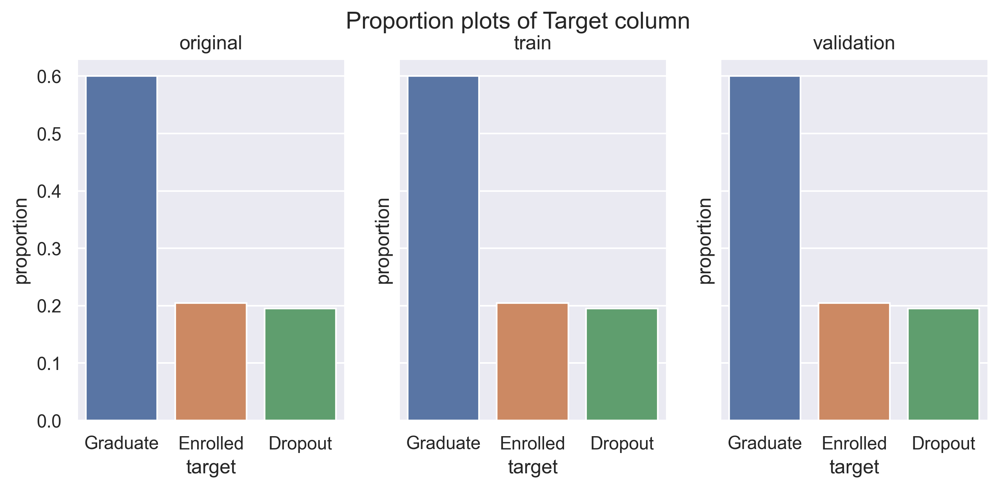

In [8]:
fig, ax = plt.subplots(1,3, figsize=(10,4), sharex=True, sharey=True)
orig_label = data[target_column].value_counts(normalize = True).reset_index()
tr_label = training_data[target_column].value_counts(normalize = True).reset_index()
val_label = validation_data[target_column].value_counts(normalize = True).reset_index()
sns.barplot(data = orig_label, x = "target", y = "proportion", ax = ax[0])
ax[0].set_title("original")
sns.barplot(data = tr_label, x = "target", y = "proportion",  ax = ax[1], label = "train")
ax[1].set_title("train")
sns.barplot(data = val_label, x = "target", y = "proportion", ax = ax[2], label = "validation")
ax[2].set_title("validation")
plt.suptitle("Proportion plots of Target column")
plt.show()

In [9]:
# # Split into Train & Validation Data
# train_data = data.sample(frac=0.5)
# validation_data = data.drop(train_data.index)

##### Preprocess Categorical Columns

In [10]:
wrapped_train_data, idx_to_key_train, key_to_idx_train = \
                    wrap_category_columns(training_data,cat_cols)
                    
wrapped_val_data, idx_to_key_val, key_to_idx_val = \
                    wrap_category_columns(validation_data,cat_cols)     

print(f"Data Shape: {data.shape}\n Preprocessed Training Shape: {wrapped_train_data.shape}\n Preprocessed Validation Shape: {wrapped_val_data.shape}")   

Data Shape: (3554, 21)
 Preprocessed Training Shape: (1777, 11)
 Preprocessed Validation Shape: (1777, 11)


##### Bins Hyperparameter

In [11]:

bins = [100] * len(wrapped_train_data.columns)

# bins = [41, 251, 11, 31, 31, 11, 31, 21, 61, 41, 131, 361, 81, 11, 1, 421, 321, 451, 351, 11, 40]


##### Train NoGAN Model

In [12]:
nogan = NoGANSynth(wrapped_train_data,random_seed=seed)
start_time = timer()
nogan.fit()
wrapped_nogan_synth_data = nogan.generate_synthetic_data(len(wrapped_train_data))
end_time = timer()
nogan_training_time = end_time - start_time
print(wrapped_train_data.shape, wrapped_nogan_synth_data.shape)

(1777, 11) (1777, 11)


##### Expand Categorical Columns in Synth Data

In [13]:
nogan_synth_data = unwrap_category_columns(data=wrapped_nogan_synth_data,idx_to_key=idx_to_key_train, cat_cols=cat_cols)

nogan_synth_data = nogan_synth_data[features]

print(nogan_synth_data.shape)

(1777, 21)


##### CTGAN Training


In [14]:
ctgan = CTGAN(verbose=False)

start_time = timer()
ctgan.fit(training_data, discrete_columns = cat_cols, epochs = 200 )
ctgan_synth_data = ctgan.sample(len(validation_data))
end_time = timer()
ctgan_training_time = end_time - start_time

print(ctgan_synth_data.shape)

(1777, 21)


##### Encode Categorical Columns in CTGAN Synth Data

In [15]:
wrapped_ctgan_synth_data, idx_to_key_ctgan_synth, key_to_idx_ctgan_synth = \
                    wrap_category_columns(ctgan_synth_data, cat_cols = cat_cols)
                    
print(wrapped_ctgan_synth_data.shape)                    

(1777, 11)


##### Evaluate the fit between Validation Data & NoGAN Synth Data, Validation Data & CTGAN Synth Data and Validation Data & Training Data

In [16]:
# Calculate ECDFs & KS Stats 

# For NoGAN
_, ecdf_val1, ecdf_nogan_synth = \
            multivariate_ecdf(wrapped_val_data, 
                              wrapped_nogan_synth_data, 
                              n_nodes = 1000,
                              verbose = True,
                              random_seed=seed)

# For CTGAN
_, ecdf_val2, ecdf_ctgan_synth = \
            multivariate_ecdf(wrapped_val_data, 
                              wrapped_ctgan_synth_data, 
                              n_nodes = 1000,
                              verbose = True,
                              random_seed=seed)            

_, ecdf_val3, ecdf_train = \
            multivariate_ecdf(wrapped_val_data, 
                              wrapped_train_data, 
                              n_nodes = 1000,
                              verbose = True,
                              random_seed=seed)
            
ks_stat_nogan = ks_statistic(ecdf_val1, ecdf_nogan_synth)
ks_stat_ctgan = ks_statistic(ecdf_val2, ecdf_ctgan_synth)
base_ks_stat = ks_statistic(ecdf_val3, ecdf_train)                              

print(f"KS Stat NoGAN (Synth vs Validation): {ks_stat_nogan:.5f}")
print(f"KS Stat CTGAN (Synth vs Validation): {ks_stat_ctgan:.5f}")
print(f"Base KS Stat (Train vs Validation): {base_ks_stat:.5f}")

Sampling ecdf, location = 0
Sampling ecdf, location = 100
Sampling ecdf, location = 200
Sampling ecdf, location = 300
Sampling ecdf, location = 400
Sampling ecdf, location = 500
Sampling ecdf, location = 600
Sampling ecdf, location = 700
Sampling ecdf, location = 800
Sampling ecdf, location = 900
Sampling ecdf, location = 0
Sampling ecdf, location = 100
Sampling ecdf, location = 200
Sampling ecdf, location = 300
Sampling ecdf, location = 400
Sampling ecdf, location = 500
Sampling ecdf, location = 600
Sampling ecdf, location = 700
Sampling ecdf, location = 800
Sampling ecdf, location = 900
Sampling ecdf, location = 0
Sampling ecdf, location = 100
Sampling ecdf, location = 200
Sampling ecdf, location = 300
Sampling ecdf, location = 400
Sampling ecdf, location = 500
Sampling ecdf, location = 600
Sampling ecdf, location = 700
Sampling ecdf, location = 800
Sampling ecdf, location = 900
KS Stat NoGAN (Synth vs Validation): 0.07203
KS Stat CTGAN (Synth vs Validation): 0.40687
Base KS Stat (Tr

##### Plot with 2 variables after PCA reduction

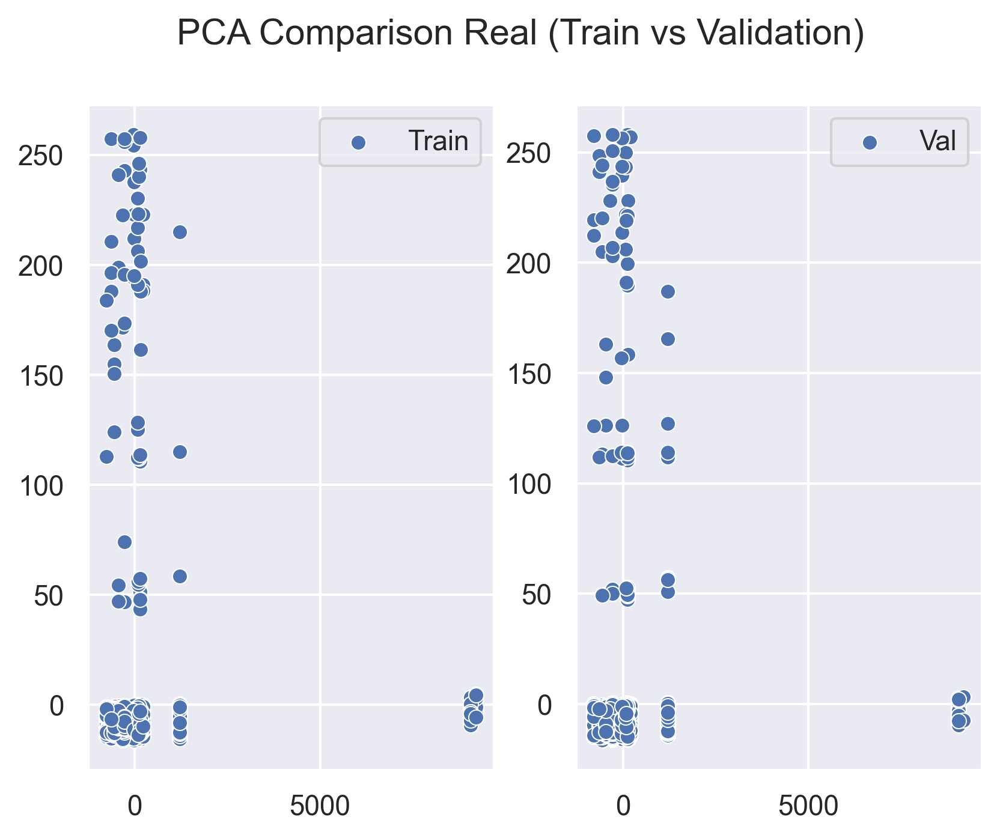

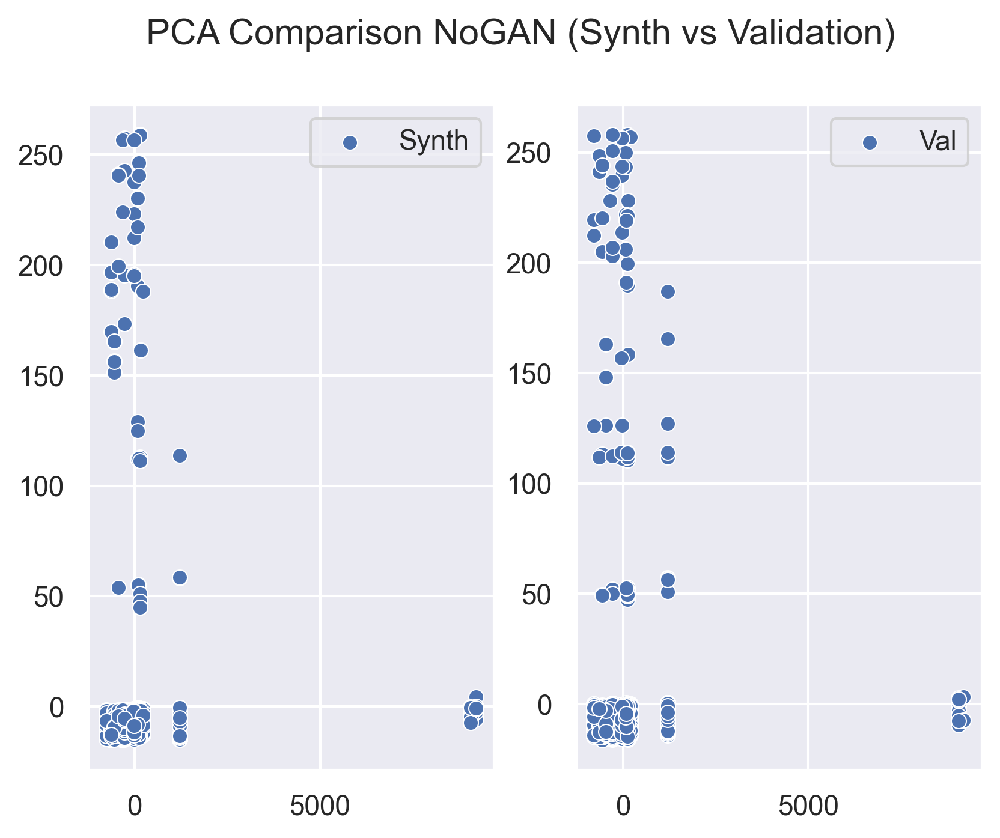

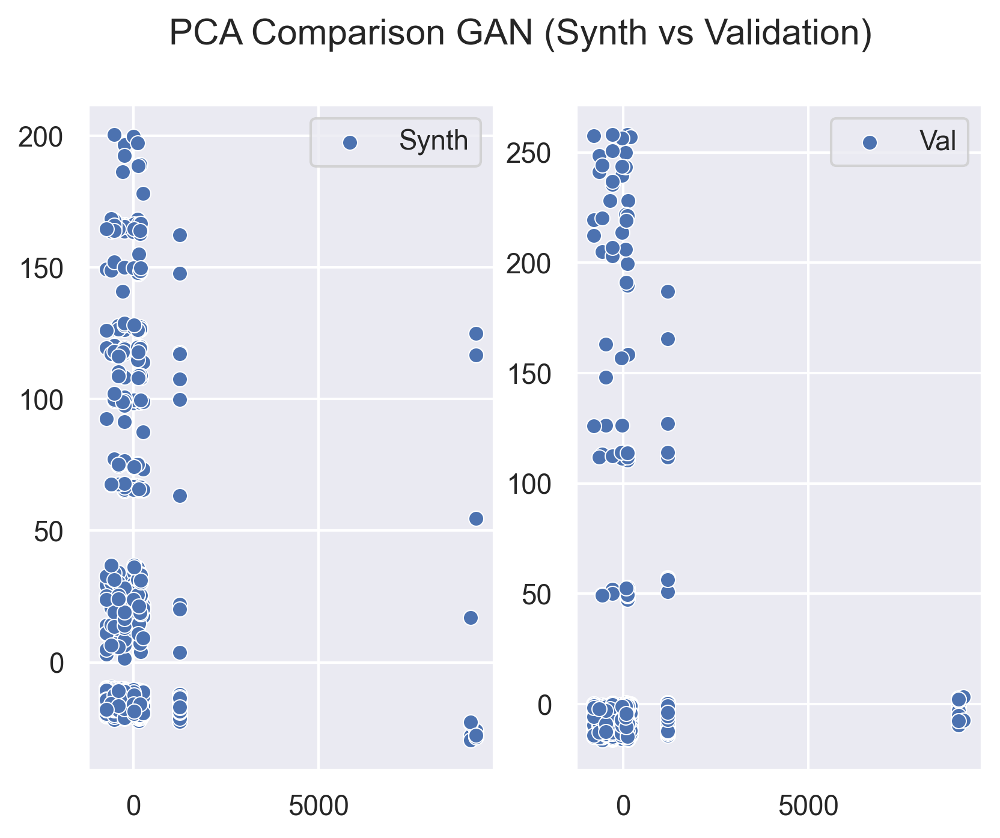

In [17]:
utils.plot_pca_comparison(training_data, 
                          validation_data, 
                          df_a_name = "Train",
                          df_b_name = "Val",     
                          title = "PCA Comparison Real (Train vs Validation)")

utils.plot_pca_comparison(nogan_synth_data, 
                          validation_data, 
                          df_a_name = "Synth",
                          df_b_name = "Val",     
                          title = "PCA Comparison NoGAN (Synth vs Validation)")

utils.plot_pca_comparison(ctgan_synth_data, 
                          validation_data, 
                          df_a_name = "Synth",
                          df_b_name = "Val",     
                          title = "PCA Comparison GAN (Synth vs Validation)")

##### Plot KDE plots NoGAN

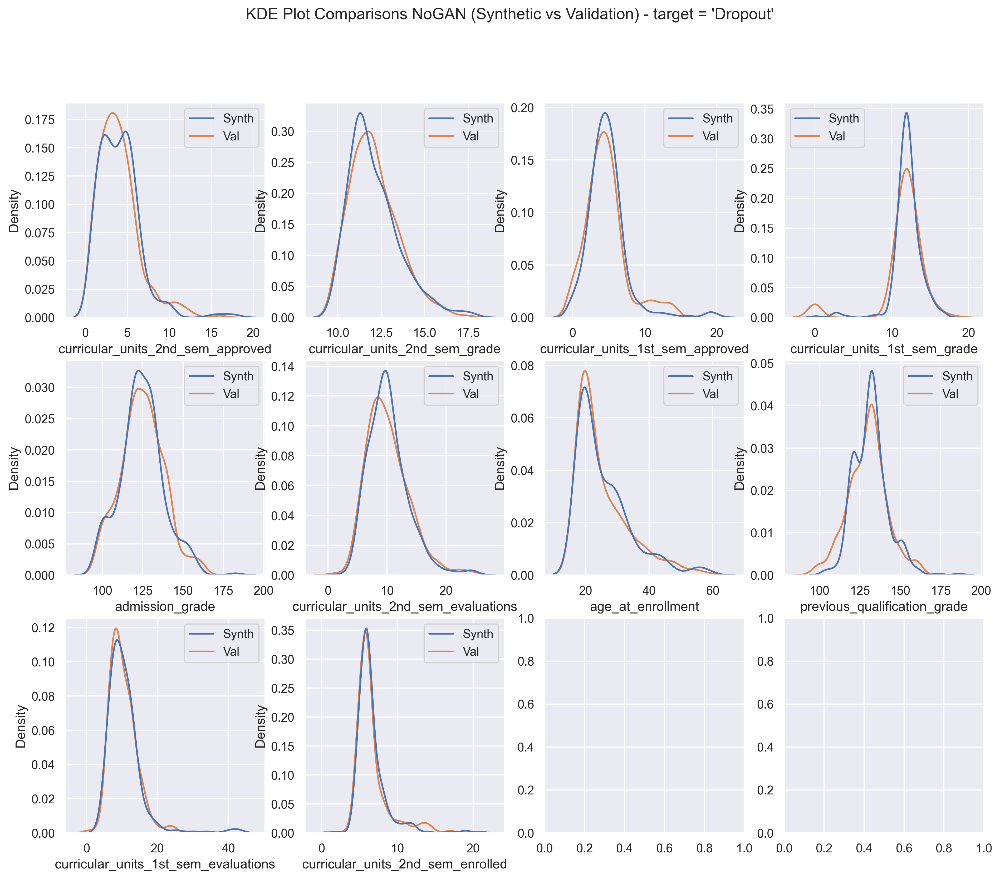

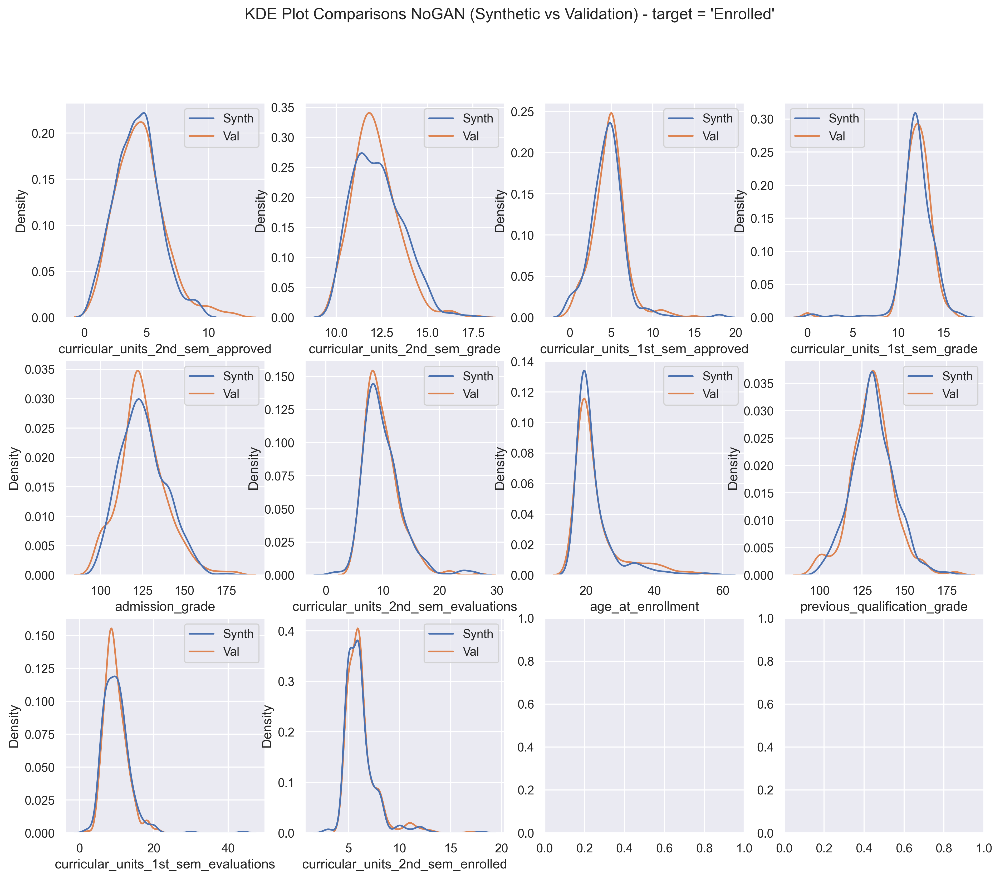

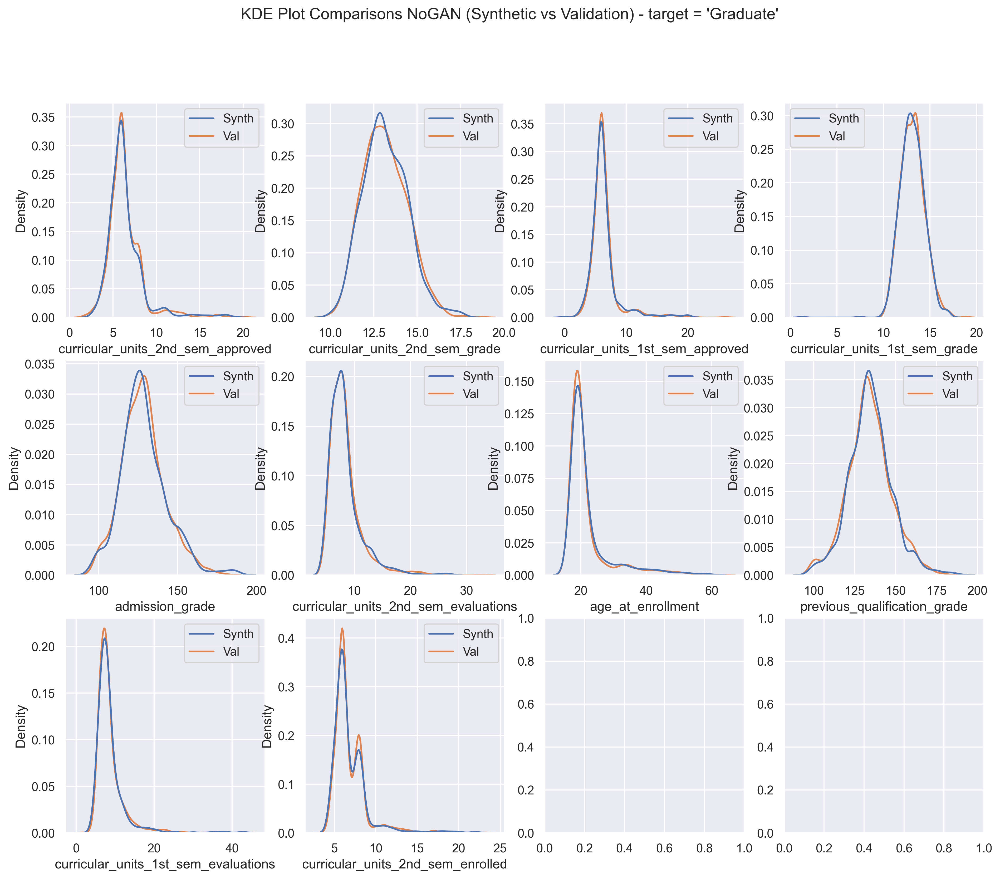

In [18]:
plot_features = num_cols
#plot_features = list(nogan_synth_data.columns)
#plot_features.remove("target")
sd = nogan_synth_data
vd = validation_data

utils.plot_density_comparison(sd.query("target == 'Dropout'"), 
                                vd.query("target == 'Dropout'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",
                                features = plot_features, 
                                title = "KDE Plot Comparisons NoGAN (Synthetic vs Validation) - target = 'Dropout'")

utils.plot_density_comparison(sd.query("target == 'Enrolled'"), 
                                vd.query("target == 'Enrolled'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = plot_features, 
                                title = "KDE Plot Comparisons NoGAN (Synthetic vs Validation) - target = 'Enrolled'")

utils.plot_density_comparison(sd.query("target == 'Graduate'"), 
                                vd.query("target == 'Graduate'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = plot_features, 
                                title = "KDE Plot Comparisons NoGAN (Synthetic vs Validation) - target = 'Graduate'")

##### Plot KDE plots CTGAN

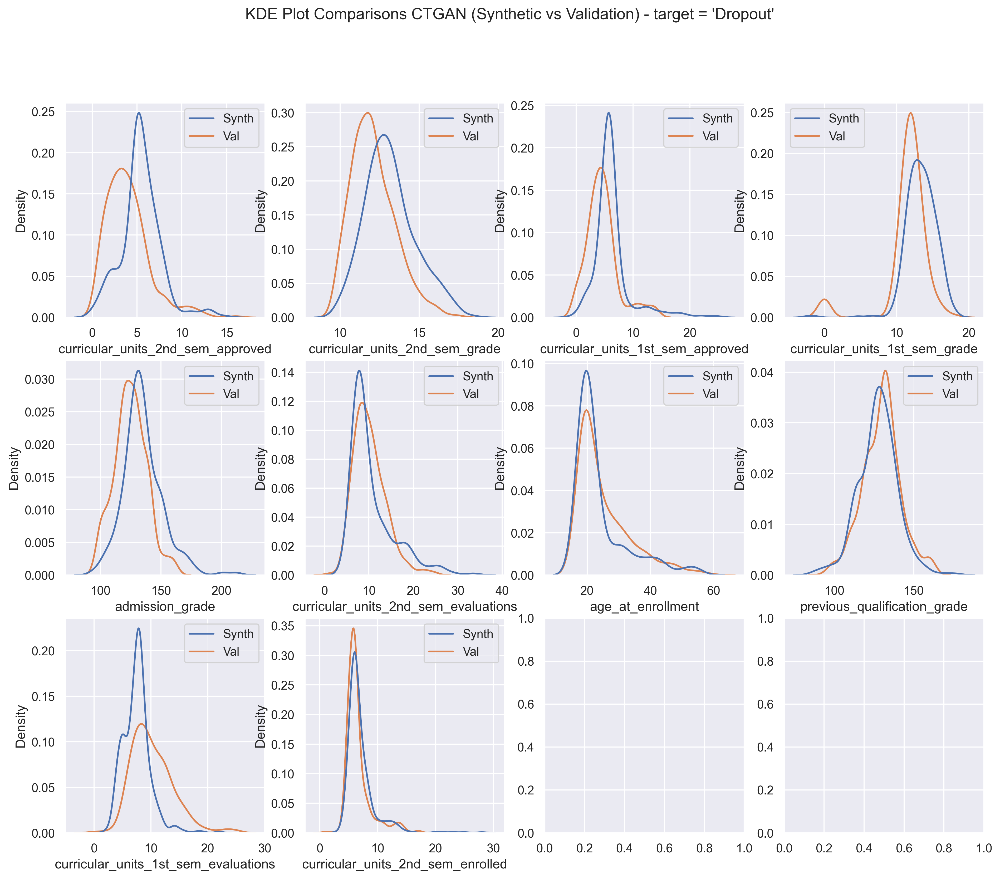

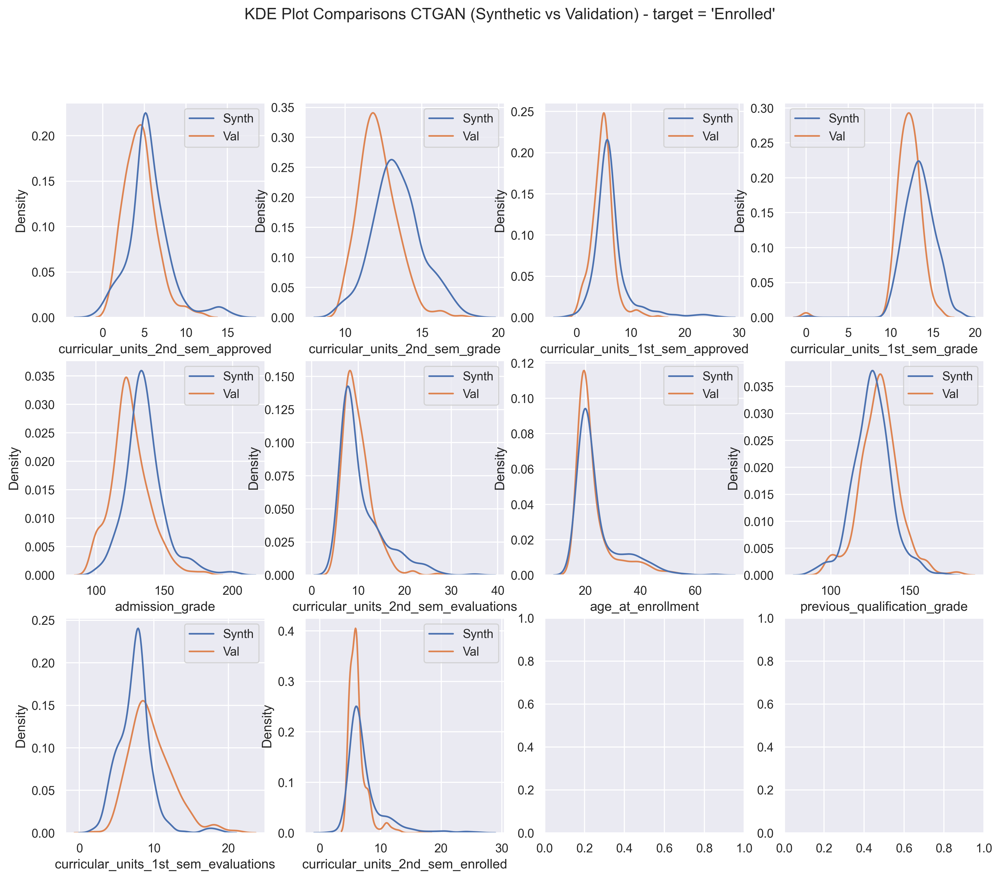

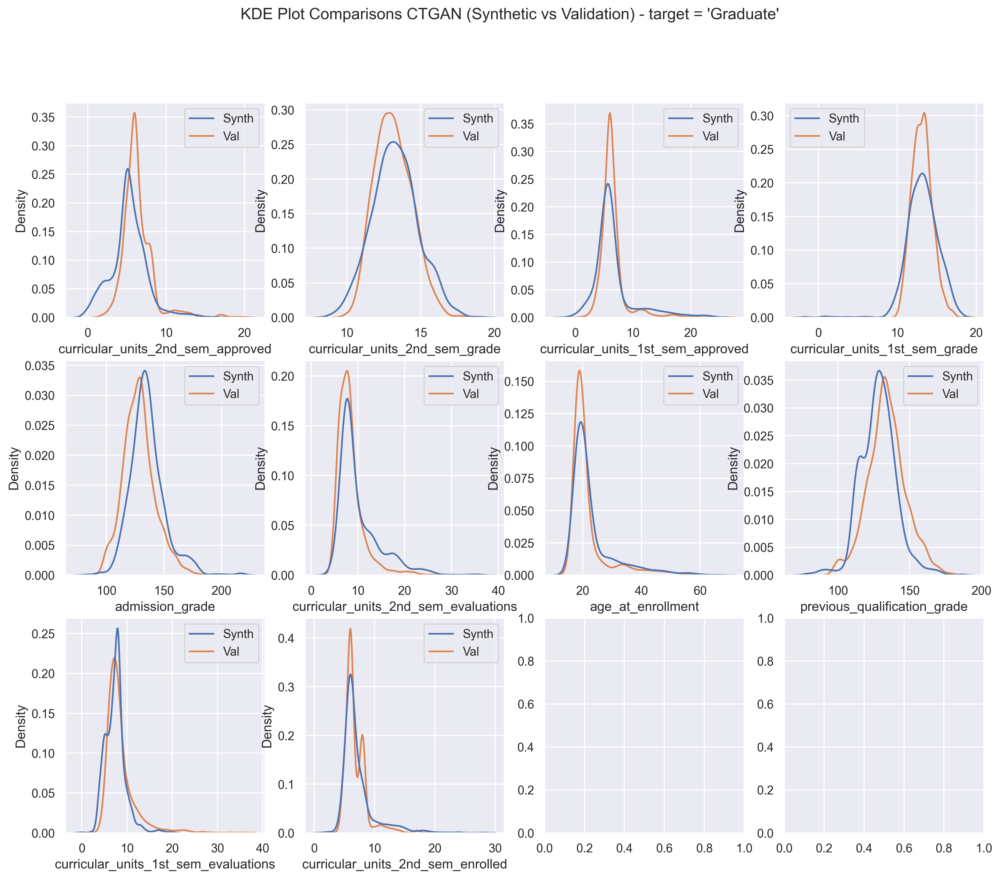

In [19]:
plot_features = num_cols
sd = ctgan_synth_data
vd = validation_data

utils.plot_density_comparison(sd.query("target == 'Dropout'"), 
                                vd.query("target == 'Dropout'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",
                                features = plot_features, 
                                title = "KDE Plot Comparisons CTGAN (Synthetic vs Validation) - target = 'Dropout'")

utils.plot_density_comparison(sd.query("target == 'Enrolled'"), 
                                vd.query("target == 'Enrolled'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = plot_features, 
                                title = "KDE Plot Comparisons CTGAN (Synthetic vs Validation) - target = 'Enrolled'")

utils.plot_density_comparison(sd.query("target == 'Graduate'"), 
                                vd.query("target == 'Graduate'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = plot_features, 
                                title = "KDE Plot Comparisons CTGAN (Synthetic vs Validation) - target = 'Graduate'")


##### Bar Chart to Compare Categorical Columns - NoGAN

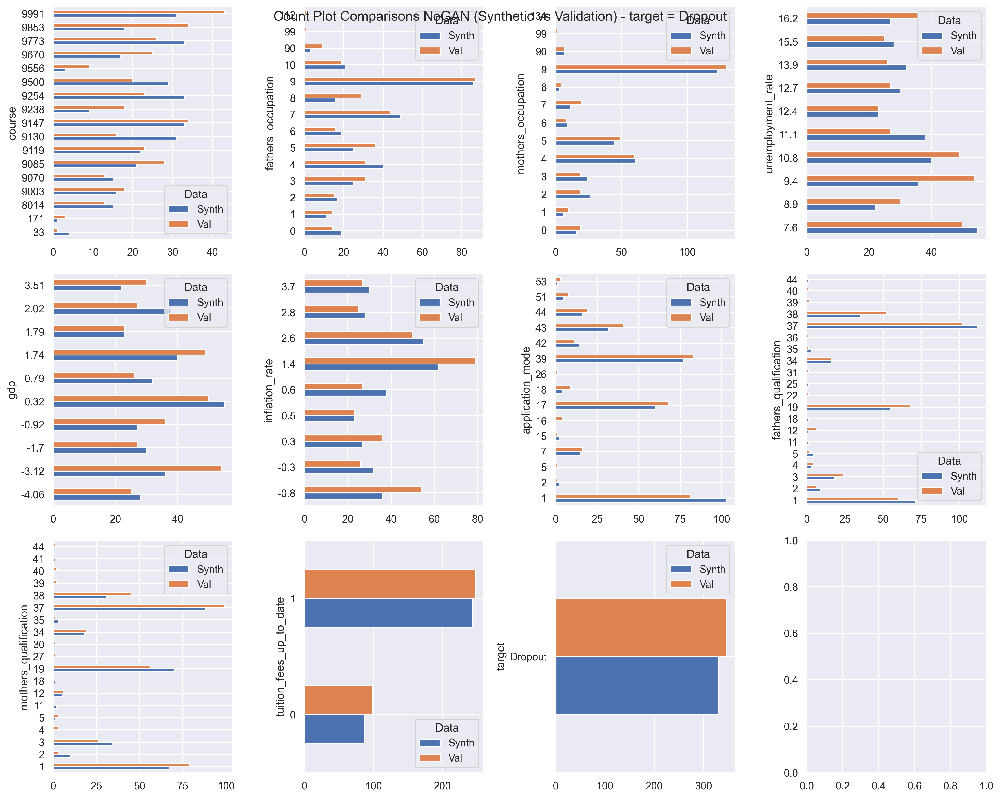

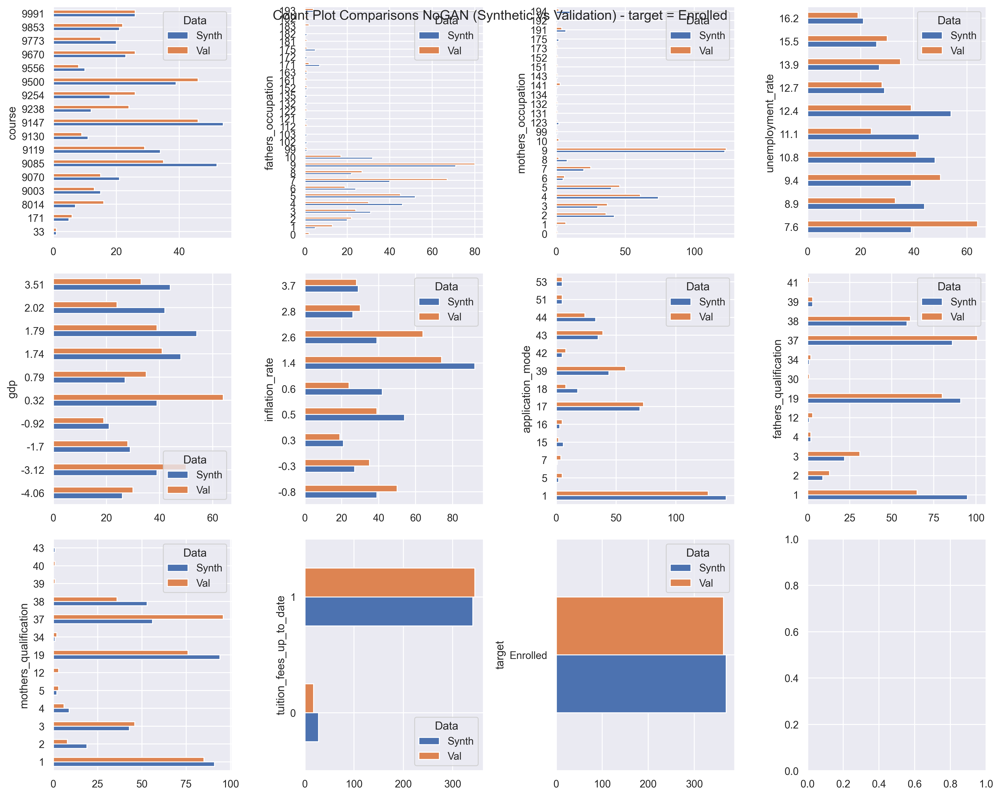

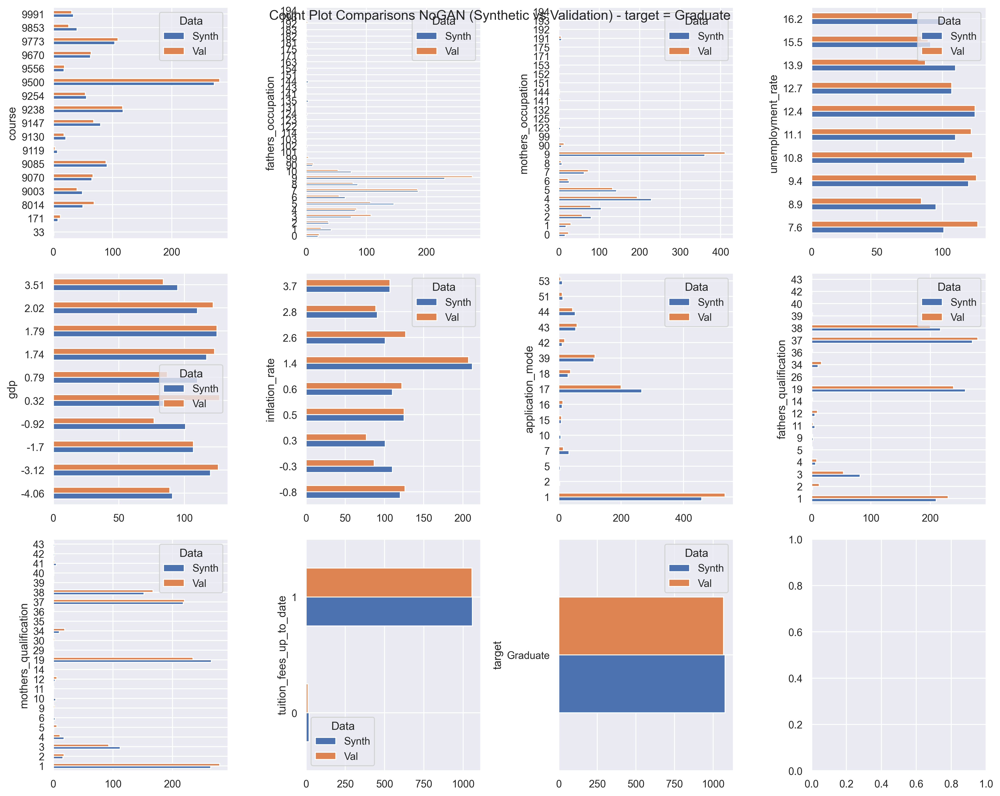

In [20]:
cat_plot_features = cat_cols.copy()
sd = nogan_synth_data[cat_plot_features]
vd = validation_data[cat_plot_features]

utils.plot_count_comparison(sd.query("target == 'Dropout'"), 
                                vd.query("target == 'Dropout'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",
                                features = cat_plot_features, 
                                title = "Count Plot Comparisons NoGAN (Synthetic vs Validation) - target = Dropout")

utils.plot_count_comparison(sd.query("target == 'Enrolled'"), 
                                vd.query("target == 'Enrolled'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = cat_plot_features, 
                                title = "Count Plot Comparisons NoGAN (Synthetic vs Validation) - target = Enrolled")

utils.plot_count_comparison(sd.query("target == 'Graduate'"), 
                                vd.query("target == 'Graduate'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = cat_plot_features, 
                                title = "Count Plot Comparisons NoGAN (Synthetic vs Validation) - target = Graduate")

##### Bar Chart to Compare Categorical Columns - CTGAN

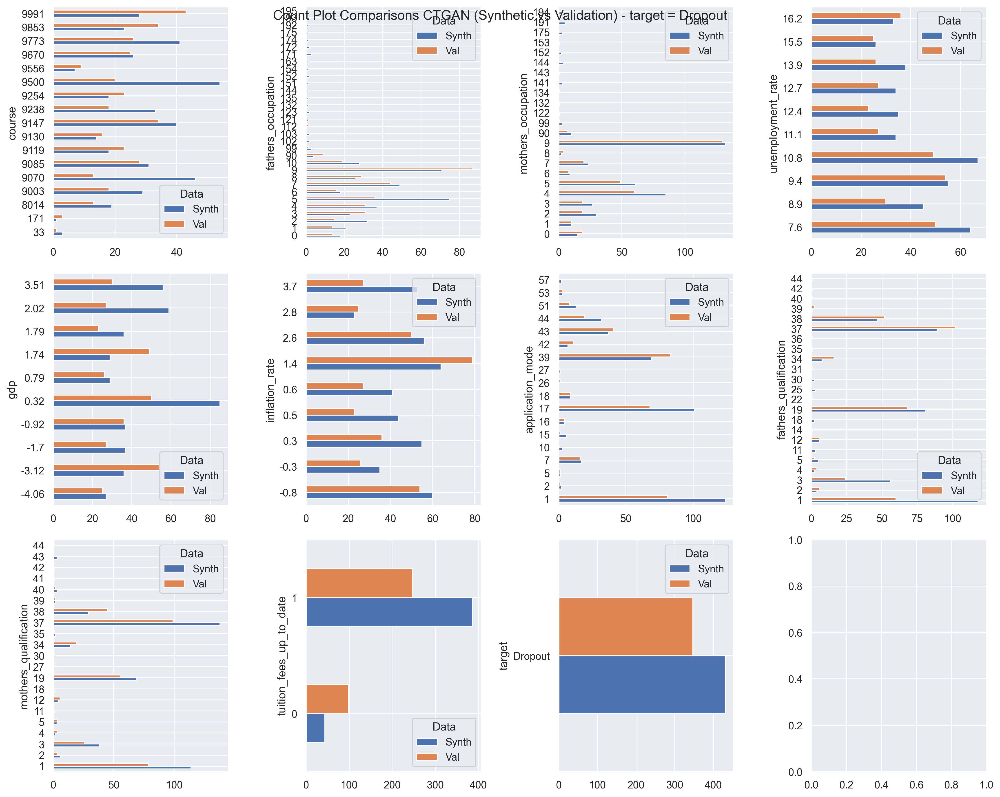

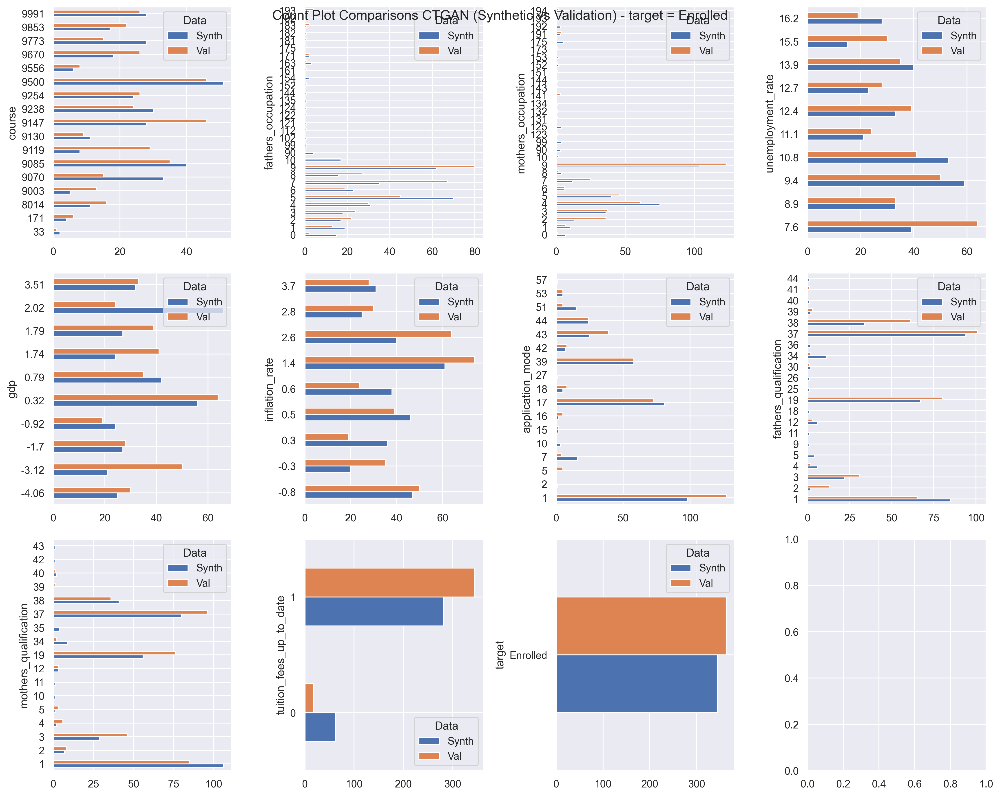

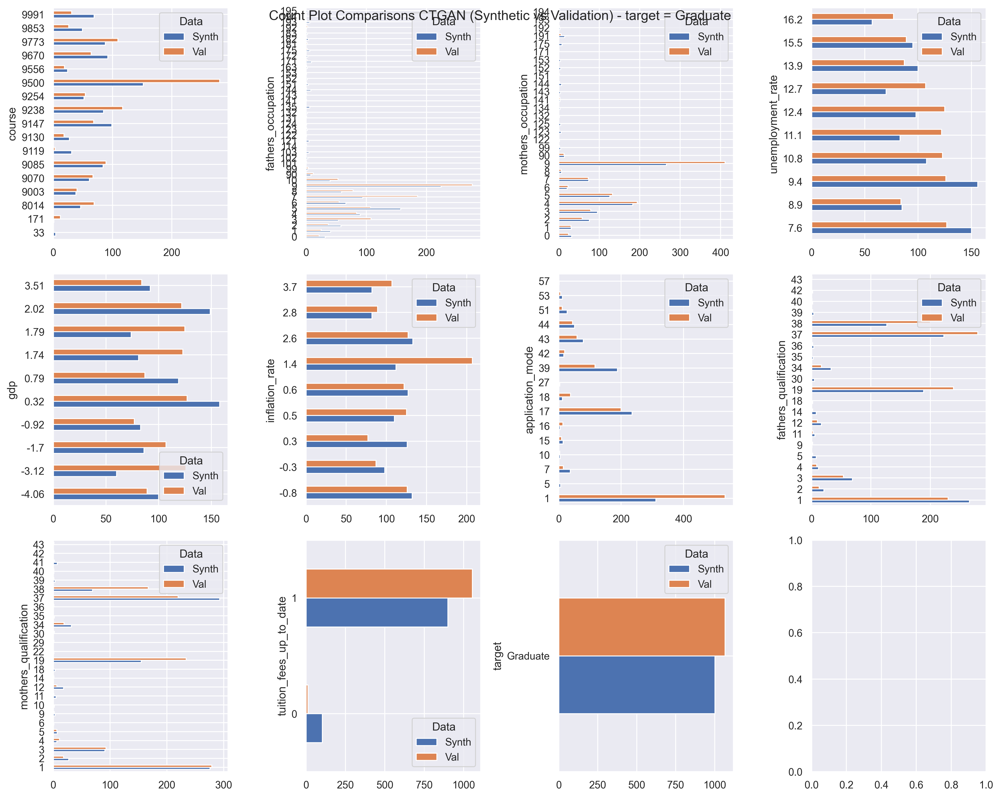

In [21]:
cat_plot_features = cat_cols.copy()
sd = ctgan_synth_data[cat_plot_features]
vd = validation_data[cat_plot_features]

utils.plot_count_comparison(sd.query("target == 'Dropout'"), 
                                vd.query("target == 'Dropout'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",
                                features = cat_plot_features, 
                                title = "Count Plot Comparisons CTGAN (Synthetic vs Validation) - target = Dropout")

utils.plot_count_comparison(sd.query("target == 'Enrolled'"), 
                                vd.query("target == 'Enrolled'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = cat_plot_features, 
                                title = "Count Plot Comparisons CTGAN (Synthetic vs Validation) - target = Enrolled")

utils.plot_count_comparison(sd.query("target == 'Graduate'"), 
                                vd.query("target == 'Graduate'"), 
                                df_a_name = "Synth",
                                df_b_name = "Val",                                
                                features = cat_plot_features, 
                                title = "Count Plot Comparisons CTGAN (Synthetic vs Validation) - target = Graduate")

##### Evaluation using Table Evaluator Package

In [22]:
print("********** Evaluation for NoGAN **********")
from table_evaluator import load_data, TableEvaluator

table_evaluator_nogan = TableEvaluator(validation_data, nogan_synth_data, cat_cols=cat_cols)

table_evaluator_nogan.evaluate(target_col='target')

********** Evaluation for NoGAN **********

Classifier F1-scores and their Jaccard similarities::
                             f1_real  f1_fake  jaccard_similarity
index                                                            
DecisionTreeClassifier_fake   0.5955   0.7303              0.3536
DecisionTreeClassifier_real   0.6236   0.5646              0.3852
LogisticRegression_fake       0.7247   0.7303              0.7756
LogisticRegression_real       0.7500   0.7444              0.8025
MLPClassifier_fake            0.7022   0.6854              0.6256
MLPClassifier_real            0.7051   0.6882              0.6219
RandomForestClassifier_fake   0.6882   0.8034              0.5964
RandomForestClassifier_real   0.6938   0.6798              0.5717

Privacy results:
                                         result
Duplicate rows between sets (real/fake)  (0, 0)
nearest neighbor mean                    3.4746
nearest neighbor std                     0.5697

Miscellaneous results:
        

In [23]:
print("********** Evaluation for CTGAN **********")
from table_evaluator import load_data, TableEvaluator

table_evaluator_ctgan = TableEvaluator(validation_data, ctgan_synth_data, cat_cols=cat_cols)

table_evaluator_ctgan.evaluate(target_col='target')

********** Evaluation for CTGAN **********

Classifier F1-scores and their Jaccard similarities::
                             f1_real  f1_fake  jaccard_similarity
index                                                            
DecisionTreeClassifier_fake   0.4270   0.4157              0.2737
DecisionTreeClassifier_real   0.6601   0.4466              0.2806
LogisticRegression_fake       0.4157   0.5730              0.3719
LogisticRegression_real       0.7247   0.6208              0.5478
MLPClassifier_fake            0.5449   0.5590              0.6330
MLPClassifier_real            0.6882   0.6039              0.5964
RandomForestClassifier_fake   0.4719   0.5197              0.2899
RandomForestClassifier_real   0.7444   0.5197              0.4183

Privacy results:
                                         result
Duplicate rows between sets (real/fake)  (0, 0)
nearest neighbor mean                    4.0677
nearest neighbor std                     0.6983

Miscellaneous results:
        

##### Results
NoGAN outperforms CTGAN

In [24]:
comp_results = {}
comp_results["nogan"] = {"ks_stat": ks_stat_nogan, "train_eval_time": nogan_training_time}
comp_results["ctgan"] = {"ks_stat": ks_stat_ctgan, "train_eval_time": ctgan_training_time}

final_results_df = pd.DataFrame.from_dict(comp_results, orient="index").reset_index().rename(columns = {"index": "algorithm"})
final_results_df

,algorithm,ks_stat,train_eval_time
0,nogan,0.0720,0.1603
1,ctgan,0.4069,192.0156


##### Observations
* NoGAN's evaluation metric is much better (lower) than CTGAN's.
* NoGAN's training time is approximately 99.93% more efficient (faster) than CTGAN's.
* Table Evaluator package shows much higher similarity score for NoGAN (0.93) compared to CTGAN (0.68)
* Visualizations like PCA, KDE and Bar Plots show that the distributions of columns for NoGAN are much similar to Validation data than CTGAN's.